# Downloading the data

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
!cp /content/drive/My\ Drive/Colab\ Notebooks/DL/ign_dataset.zip .
!unzip ign_dataset.zip

Archive:  ign_dataset.zip
   creating: ign/
   creating: ign/annotations/
   creating: ign/annotations/training/
  inflating: ign/annotations/training/c0_0915_6395.png  
  inflating: ign/annotations/training/c0_0920_6390.png  
  inflating: ign/annotations/training/c0_0935_6390.png  
  inflating: ign/annotations/training/c0_0935_6400.png  
  inflating: ign/annotations/training/c0_0955_6380.png  
  inflating: ign/annotations/training/c0_0960_6390.png  
  inflating: ign/annotations/training/c0_0975_6425.png  
  inflating: ign/annotations/training/c0_0990_6405.png  
  inflating: ign/annotations/training/c10_0915_6395.png  
  inflating: ign/annotations/training/c10_0920_6390.png  
  inflating: ign/annotations/training/c10_0935_6390.png  
  inflating: ign/annotations/training/c10_0935_6400.png  
  inflating: ign/annotations/training/c10_0955_6380.png  
  inflating: ign/annotations/training/c10_0960_6390.png  
  inflating: ign/annotations/training/c10_0975_6425.png  
  inflating: ign/annotati

# Data preprocessing

In [ ]:
# Imports
import numpy as np
import matplotlib.pyplot as plt
import os
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Concatenate
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.utils import Sequence
from tensorflow.keras.metrics import Metric
from tensorflow.keras import mixed_precision
import cv2
import tensorflow.keras.backend as K

In [ ]:
# Configuration
PATCH_SIZE = 256
BATCH_SIZE = 32
NUM_CLASSES = 7
X_path = 'ign/images/training/'
Y_path = 'ign/annotations/training/'

# Data Preparation
train_names = sorted(os.listdir(X_path))[:600]
val_names = sorted(os.listdir(Y_path))[600:800]

X_val= 'ign/images/validation/'
Y_val= 'ign/annotations/validation/'

train_names = sorted(os.listdir(X_path))[:]
val_names = sorted(os.listdir(X_val))[:]

# Check if the number of images and labels match
num_val_images = len((train_names))
num_val_labels = len((val_names))
print(f"\nNumber of validation images: {num_val_images}")
print(f"Number of validation labels: {num_val_labels}")


Number of validation images: 600
Number of validation labels: 200


# Data Generator

In [ ]:
# Data Generator
class DataGenerator(Sequence):
    def __init__(self, image_filenames, label_filenames, batch_size, patch_size, num_classes, resize_shape=(256, 256)):
        self.image_filenames = image_filenames
        self.label_filenames = label_filenames
        self.batch_size = batch_size
        self.patch_size = patch_size
        self.num_classes = num_classes
        self.resize_shape = resize_shape

    def __len__(self):
        return int(np.ceil(len(self.image_filenames) / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_x = self.image_filenames[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.label_filenames[idx * self.batch_size:(idx + 1) * self.batch_size]

        images = [self.preprocess_image(cv2.imread(file_name)) for file_name in batch_x]
        labels = [self.preprocess_label(cv2.imread(file_name, cv2.IMREAD_GRAYSCALE)) for file_name in batch_y]

        image_patches = [self.create_patches(image) for image in images]
        label_patches = [self.create_patches(label, is_label=True) for label in labels]

        image_patches = np.vstack(image_patches)
        label_patches = np.vstack(label_patches)

        return image_patches, label_patches

    def preprocess_image(self, image):
        image = cv2.resize(image, self.resize_shape)
        return image / 255.0

    def preprocess_label(self, label):
        label = cv2.resize(label, self.resize_shape, interpolation=cv2.INTER_NEAREST)
        label = label.astype(np.uint8)
        label = np.eye(self.num_classes)[label]
        return label

    def create_patches(self, image, is_label=False):
        patches = []
        h, w = image.shape[:2]
        for i in range(0, h, self.patch_size):
            for j in range(0, w, self.patch_size):
                patch = image[i:i+self.patch_size, j:j+self.patch_size]
                if patch.shape[0] == self.patch_size and patch.shape[1] == self.patch_size:
                    patches.append(patch)
        return np.array(patches)

In [ ]:
# Visualization Function
def visualize_generator_output(generator, num_samples=5):
    for _ in range(num_samples):
        images, labels = next(iter(generator))

        fig, axes = plt.subplots(2, 5, figsize=(20, 8))
        for i in range(5):
            # Display image
            axes[0, i].imshow(images[i])
            axes[0, i].set_title(f"Image {i+1}")
            axes[0, i].axis('off')

            # Display label (segmentation mask)
            axes[1, i].imshow(np.argmax(labels[i], axis=-1), cmap='jet', vmin=0, vmax=NUM_CLASSES-1)
            axes[1, i].set_title(f"Segmentation Mask {i+1}")
            axes[1, i].axis('off')

        plt.tight_layout()
        plt.show()


In this code I set up data generators for training and validation datasets. The train_generator and val_generator read images and labels from specified paths, with parameters like batch size, patch size, and the number of classes defined. This helps in efficiently loading and preprocessing the data during model training. I also visualize the output of the training generator to ensure the data is being processed correctly

Visualizing generator output:


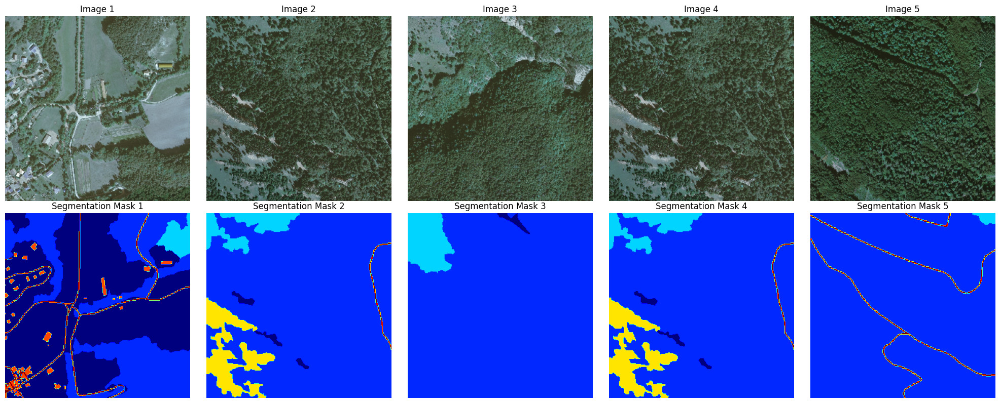

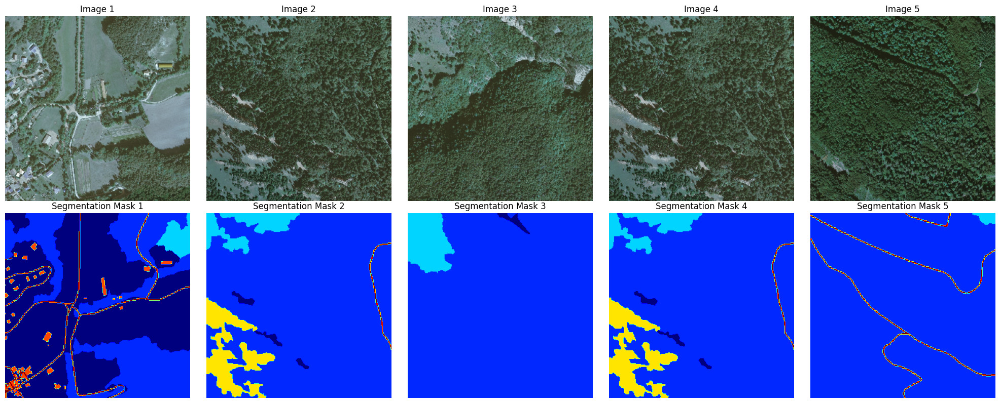

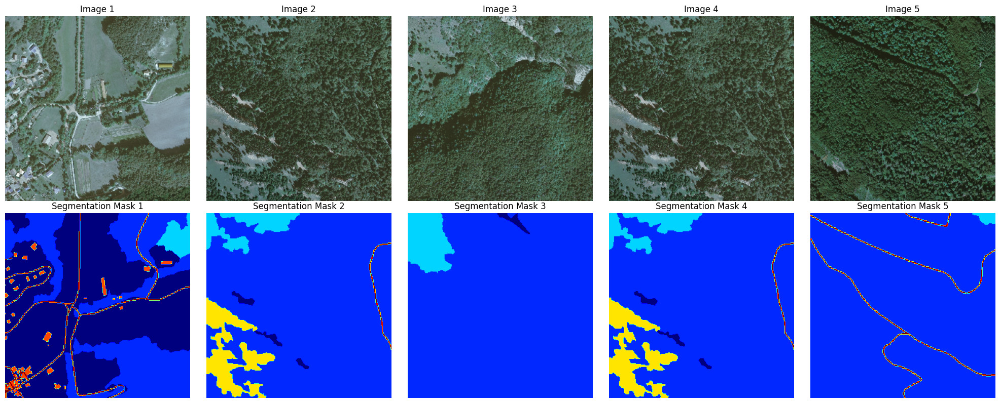

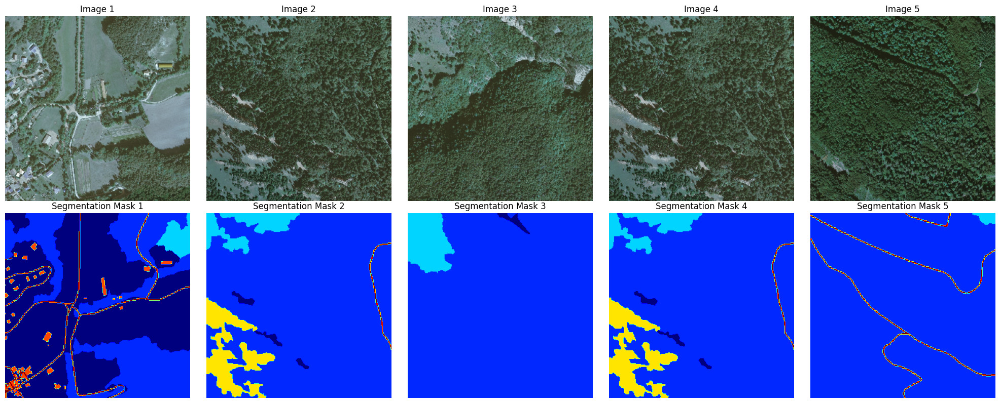

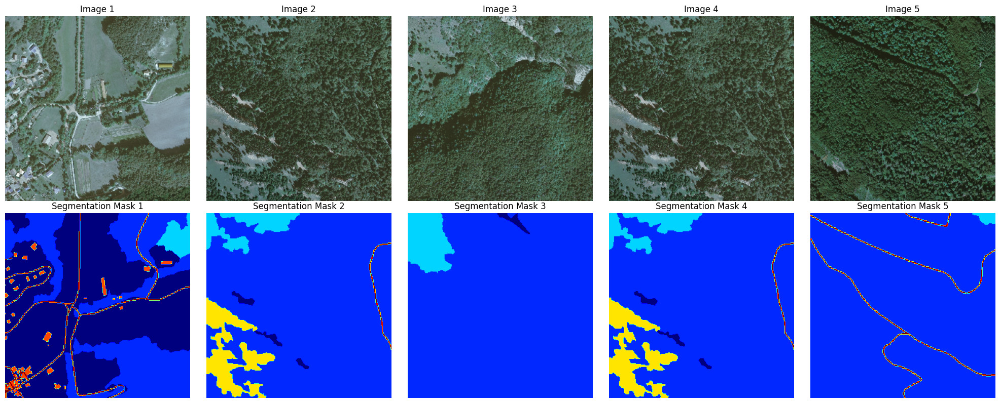

In [ ]:
# Data Generators
train_generator = DataGenerator(
    image_filenames=[os.path.join(X_path, name) for name in train_names],
    label_filenames=[os.path.join(Y_path, name) for name in train_names],
    batch_size=BATCH_SIZE,
    patch_size=PATCH_SIZE,
    num_classes=NUM_CLASSES
)

val_generator = DataGenerator(
    image_filenames=[os.path.join(X_val, name) for name in val_names],
    label_filenames=[os.path.join(Y_val, name) for name in val_names],
    batch_size=BATCH_SIZE,
    patch_size=PATCH_SIZE,
    num_classes=NUM_CLASSES
)

# Visualize Generator Output
print("Visualizing generator output:")
visualize_generator_output(train_generator)

# Functions and Metrics


In this code, I define a custom metric for evaluating multi-label classification models using the Dice coefficient. I included a couple of functions: one for calculating the Dice coefficient for a single label and another for averaging it across multiple labels. And I also created a class, DiceCoefMultilabel, which is a custom Keras metric to help me track the performance of my multi-label models during training.


In [ ]:
def dice_coef(y_true, y_pred, smooth=1e-6):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_coef_multilabel(y_true, y_pred):
    num_labels = K.int_shape(y_pred)[-1]
    dice = 0
    for index in range(num_labels):
        dice += dice_coef(y_true[..., index], y_pred[..., index])
    return dice / num_labels

class DiceCoefMultilabel(Metric):
    def __init__(self, num_classes, name='dice_coef_multilabel', **kwargs):
        super(DiceCoefMultilabel, self).__init__(name=name, **kwargs)
        self.num_classes = num_classes
        self.dice_sum = self.add_weight(name='dice_sum', initializer='zeros')
        self.num_samples = self.add_weight(name='num_samples', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        dice = dice_coef_multilabel(y_true, y_pred)
        self.dice_sum.assign_add(dice)
        self.num_samples.assign_add(1)

    def result(self):
        return self.dice_sum / self.num_samples

    def reset_states(self):
        self.dice_sum.assign(0)
        self.num_samples.assign(0)


# Model

 In this code, I define a U-Net model for image segmentation in this code. The U-Net consists of an encoder for downsampling, a bridge, and a decoder for upsampling. The encoder reduces spatial dimensions using convolutional and max pooling layers, while the decoder upsamples and concatenates features from the encoder. This model is ideal for tasks like medical image segmentation.


In [ ]:

# Model Definition (U-Net)
def unet(input_size=(256, 256, 3)):
    inputs = Input(input_size)

    # Encoder (Downsampling)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    # Bridge
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(conv4)

    # Decoder (Upsampling)
    up5 = UpSampling2D(size=(2, 2))(conv4)
    up5 = Concatenate()([up5, conv3])
    conv5 = Conv2D(256, 3, activation='relu', padding='same')(up5)
    conv5 = Conv2D(256, 3, activation='relu', padding='same')(conv5)

    up6 = UpSampling2D(size=(2, 2))(conv5)
    up6 = Concatenate()([up6, conv2])
    conv6 = Conv2D(128, 3, activation='relu', padding='same')(up6)
    conv6 = Conv2D(128, 3, activation='relu', padding='same')(conv6)

    up7 = UpSampling2D(size=(2, 2))(conv6)
    up7 = Concatenate()([up7, conv1])
    conv7 = Conv2D(64, 3, activation='relu', padding='same')(up7)
    conv7 = Conv2D(64, 3, activation='relu', padding='same')(conv7)

    outputs = Conv2D(NUM_CLASSES, 1, activation='softmax')(conv7)

    model = Model(inputs=inputs, outputs=outputs)
    return model


Here I create and compile the U-Net model, specifying the input size and using the Adam optimizer with categorical cross-entropy loss. I include the custom Dice coefficient metric for evaluation. For training, I set up callbacks for early stopping, learning rate reduction, and model checkpointing. Then, I fit the model using a training generator, with 100 epochs and validation data, while applying the specified callbacks to monitor and improve performance.

In [ ]:
# Create and compile the model
model = unet(input_size=(PATCH_SIZE, PATCH_SIZE, 3))
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[DiceCoefMultilabel(NUM_CLASSES)])

# Model training
callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=10, verbose=1),
    tf.keras.callbacks.ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    tf.keras.callbacks.ModelCheckpoint('model_best.keras', save_best_only=True, monitor='val_dice_coef_multilabel', mode='max'),
]

history = model.fit(
    train_generator,
    steps_per_epoch=len(train_generator),
    epochs=100,
    validation_data=val_generator,
    validation_steps=len(val_generator),
    callbacks=callbacks
)

Epoch 1/100
19/19 [==============================] - 44s 2s/step - loss: 2.6754 - dice_coef_multilabel: 0.1114 - val_loss: 1.4999 - val_dice_coef_multilabel: 0.1198 - lr: 0.0010
Epoch 2/100
19/19 [==============================] - 40s 2s/step - loss: 1.3893 - dice_coef_multilabel: 0.1279 - val_loss: 1.2933 - val_dice_coef_multilabel: 0.1336 - lr: 0.0010
Epoch 3/100
19/19 [==============================] - 41s 2s/step - loss: 1.2359 - dice_coef_multilabel: 0.1449 - val_loss: 1.0254 - val_dice_coef_multilabel: 0.1874 - lr: 0.0010
Epoch 4/100
19/19 [==============================] - 42s 2s/step - loss: 1.0053 - dice_coef_multilabel: 0.1993 - val_loss: 0.9173 - val_dice_coef_multilabel: 0.2180 - lr: 0.0010
Epoch 5/100
19/19 [==============================] - 39s 2s/step - loss: 0.9108 - dice_coef_multilabel: 0.2253 - val_loss: 0.9450 - val_dice_coef_multilabel: 0.2159 - lr: 0.0010
Epoch 6/100
19/19 [==============================] - 42s 2s/step - loss: 0.9338 - dice_coef_multilabel: 0.2240

# Evaluation

In this section I evaluate and plot the training history of my model. I define a function to plot the training and validation metrics, specifically loss and the Dice coefficient, over epochs. This helps visualize the model's performance during training. I also print the final values of these metrics for both training and validation datasets to get a quick summary of how well the model performed.

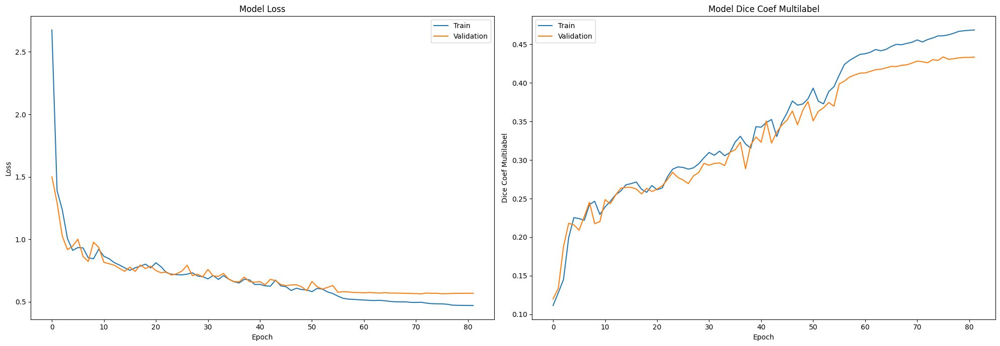

Final training metrics:
loss: 0.4697
val_loss: 0.5674

dice_coef_multilabel: 0.4686
val_dice_coef_multilabel: 0.4334



In [ ]:
# Evaluation and Plotting Results
def plot_training_history(history):
    metrics = ['loss', 'dice_coef_multilabel']
    fig, axes = plt.subplots(1, 2, figsize=(20, 7))

    for i, metric in enumerate(metrics):
        ax = axes[i]
        ax.plot(history.history[metric], label='Train')

        # Check if validation metric exists in history
        val_metric = f'val_{metric}'
        if val_metric in history.history:
            ax.plot(history.history[val_metric], label='Validation')

        ax.set_title(f'Model {metric.replace("_", " ").title()}')
        ax.set_xlabel('Epoch')
        ax.set_ylabel(metric.replace("_", " ").title())
        ax.legend()

    plt.tight_layout()
    plt.show()

    # Print the final values of metrics
    print("Final training metrics:")
    for metric in metrics:
        print(f"{metric}: {history.history[metric][-1]:.4f}")
        val_metric = f'val_{metric}'
        if val_metric in history.history:
            print(f"{val_metric}: {history.history[val_metric][-1]:.4f}")
        print()

# After training the model
plot_training_history(history)

In my training results, the model loss decreased steadily and stabilized around 0.5 for training and 0.56 for validation, indicating effective learning with minor overfitting. The Dice coefficient improved over epochs, reaching 0.468 for training and 0.433 for validation. These results show that my model is performing well in segmenting satellite images, with good generalization to unseen data.

# Making Predictions

Here I load the best model weights saved during training and evaluate the model on the validation data, printing the validation loss and Dice coefficient. I also define a function to visualize the model's predictions. This function displays a few samples of the input images, the true masks, and the predicted masks side by side. Finally, I call this function to visualize the predictions on the validation data, ensuring that the model's outputs are correctly aligned with the ground truth.

7/7 [==============================] - 8s 1s/step - loss: 0.5638 - dice_coef_multilabel: 0.4337
Validation Loss: 0.5637513995170593
Validation Dice Coefficient: 0.43372389674186707
Visualizing predictions on validation data:
1/1 [==============================] - 0s 346ms/step


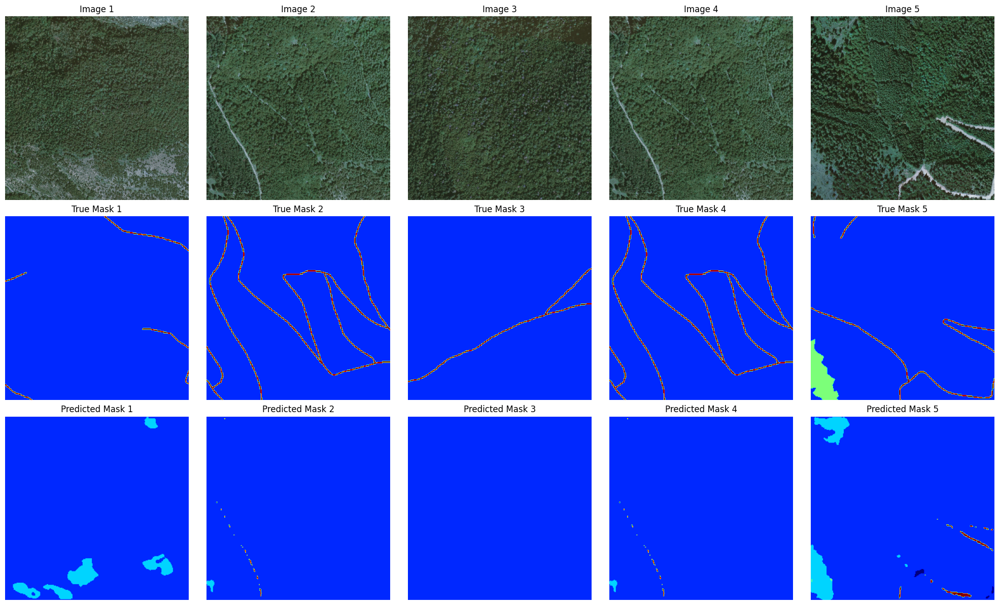

1/1 [==============================] - 0s 32ms/step


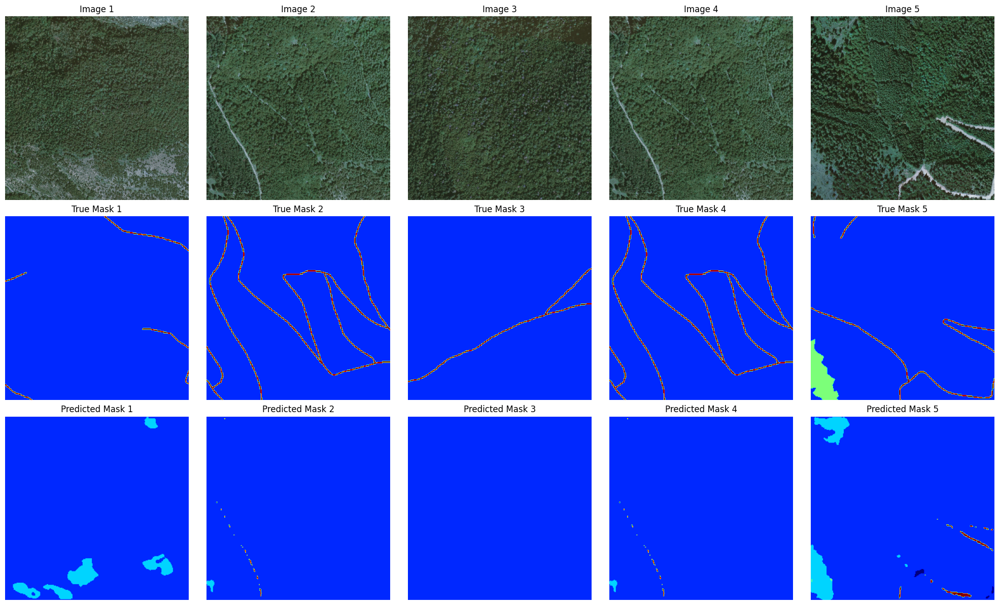

1/1 [==============================] - 0s 41ms/step


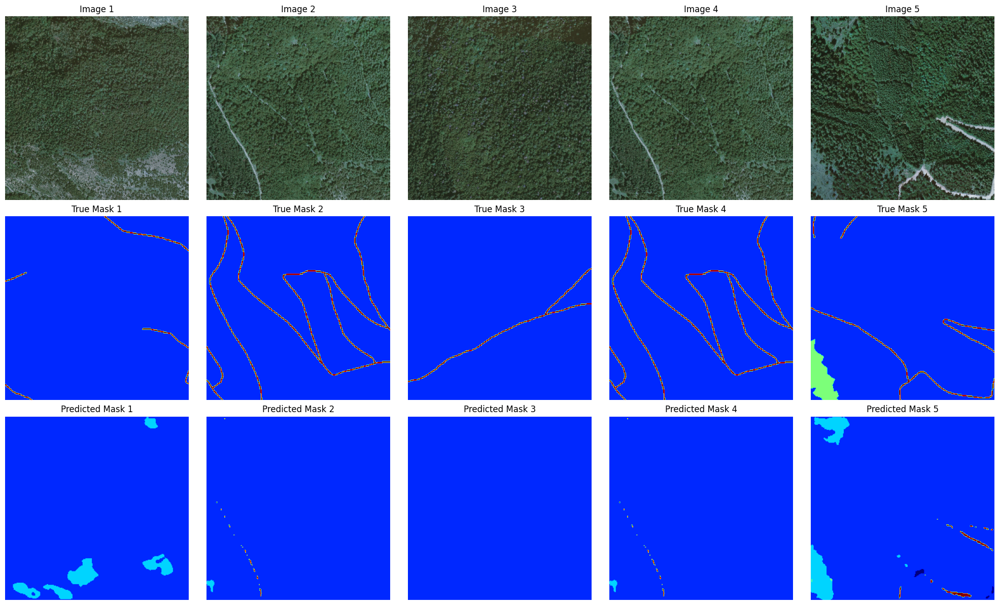

1/1 [==============================] - 0s 66ms/step


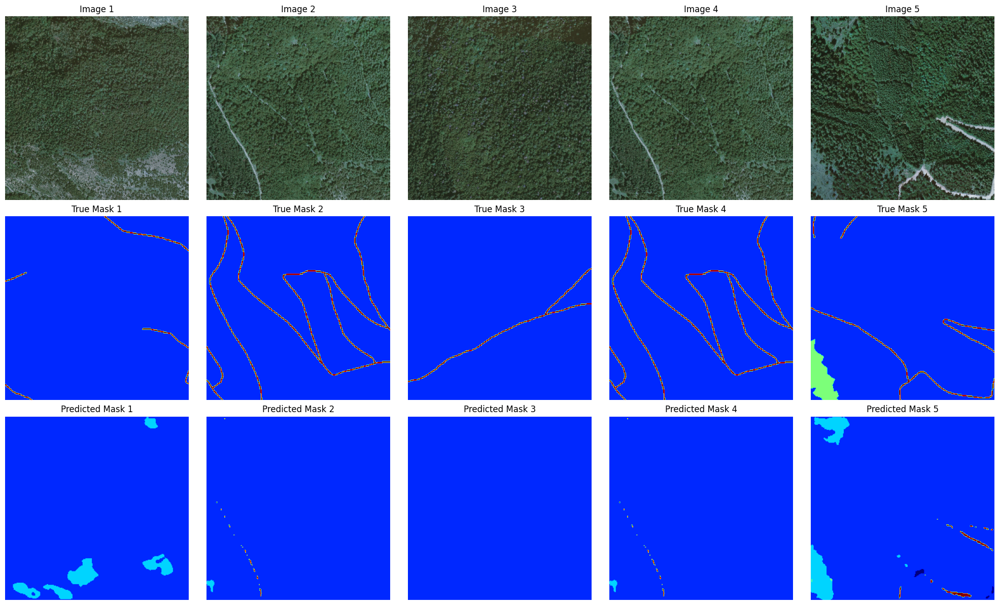

1/1 [==============================] - 0s 36ms/step


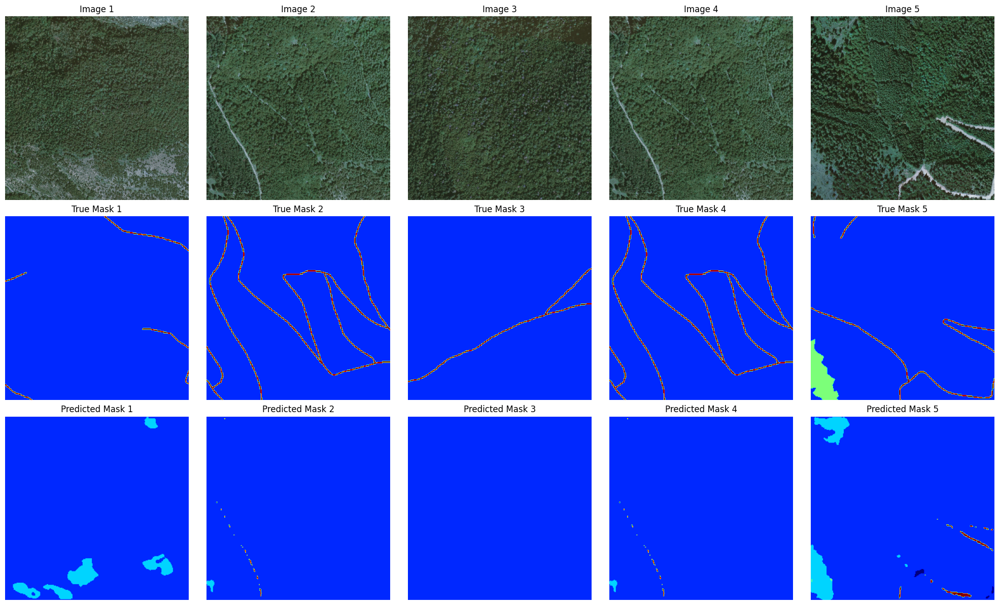

In [ ]:
# Load best model and evaluate
model.load_weights('model_best.keras')
score = model.evaluate(val_generator, verbose=1)
print(f"Validation Loss: {score[0]}")
print(f"Validation Dice Coefficient: {score[1]}")

# Function to visualize predictions
def visualize_predictions(model, generator, num_samples=5):
    for _ in range(num_samples):
        images, true_masks = next(iter(generator))
        predicted_masks = model.predict(images)

        fig, axes = plt.subplots(3, 5, figsize=(20, 12))
        for i in range(5):
            # Display image
            axes[0, i].imshow(images[i])
            axes[0, i].set_title(f"Image {i+1}")
            axes[0, i].axis('off')

            # Display true mask
            axes[1, i].imshow(np.argmax(true_masks[i], axis=-1), cmap='jet', vmin=0, vmax=NUM_CLASSES-1)
            axes[1, i].set_title(f"True Mask {i+1}")
            axes[1, i].axis('off')

            # Display predicted mask
            axes[2, i].imshow(np.argmax(predicted_masks[i], axis=-1), cmap='jet', vmin=0, vmax=NUM_CLASSES-1)
            axes[2, i].set_title(f"Predicted Mask {i+1}")
            axes[2, i].axis('off')

        plt.tight_layout()
        plt.show()

# Visualize predictions
print("Visualizing predictions on validation data:")
visualize_predictions(model, val_generator)